In [1]:
import torch    
from Classifier_NN import Classifier_NN
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
from sklearn.model_selection import train_test_split
from NObSP_Decomposition import NObSP_NN_single_MultiOutput
import torch.nn.functional as F

In [2]:
# Cargar los tensores guardados
output_tensors = torch.load('train_tensors_mnist.pth')
y = torch.load('train_labels_mnist.pth')

X = torch.cat(output_tensors).detach()
y = F.one_hot(torch.cat(y))

labels = tuple(str(i) for i in range(10)) 

In [3]:
X_sample = []
y_sample = []
all_index = []

sample_size = 150
# Supongamos que 'num_classes' es el número de clases en tus etiquetas
for i in range(10):
    indices = torch.where(y.argmax(dim=1) == i)[0]
    indices = indices[torch.randperm(len(indices))[:sample_size]]
    all_index.append(indices)
    X_sample.append(X[indices])
    y_sample.append(y[indices])

# Verifica que cada tensor en X_sample y y_sample es diferente
for i in range(len(X_sample)):
    for j in range(i + 1, len(X_sample)):
        assert id(X_sample[i]) != id(X_sample[j])
        assert id(y_sample[i]) != id(y_sample[j])

X = torch.cat(X_sample)
y = torch.cat(y_sample)

In [4]:
N = np.size(X,0); # Defining the number of datapoints
in_feat = np.size(X,1)

In [5]:
t = np.arange(0, N)
train_split = int(0.8 * N)
p = 10

In [6]:
epochs = 200
learning_rate = 0.001

In [7]:
# Split of the data for training and test
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    train_size = train_split,
    random_state=42
) 

## Creating model for single nonlinear effects

model_1 = Classifier_NN(in_number=X.shape[1], out_number=y.shape[1]) # Creating the model
loss_fcn = nn.CrossEntropyLoss() # Definning loss function
optimizer = torch.optim.Adam(model_1.parameters(), lr=learning_rate)

# Training loop for the model 1

In [8]:
for epoch in range(epochs):
    model_1.train() # Setting the model in training mode
    y_prob, x_p, y_lin = model_1(X_train) #forward pass
    
    loss = loss_fcn(y_prob,
                    y_train.float())  # Compute Loss
    loss.backward() # compute backward
    optimizer.step() # update parameters
    optimizer.zero_grad() #zero grad optimizer
    
    ## Testing
    model_1.eval() # Setting the model in evalaution mode
    with torch.inference_mode():
        y_prob_pred, x_trans, y_lin_pred = model_1(X_test) # Estimating th emodel output in test data
    
    test_loss = loss_fcn(y_prob_pred,
                         y_test.float()) # Evaluating loss
    
    if epoch % 10 == 0:
        print(f'Epoch: {epoch} | Loss: {loss:.5f} | test Loss: {test_loss:.5f}') # Printing the performance of the model as it is trained

Epoch: 0 | Loss: 2.30370 | test Loss: 2.25763
Epoch: 10 | Loss: 1.71453 | test Loss: 1.67472
Epoch: 20 | Loss: 1.53850 | test Loss: 1.51688
Epoch: 30 | Loss: 1.49719 | test Loss: 1.50692
Epoch: 40 | Loss: 1.48155 | test Loss: 1.51005
Epoch: 50 | Loss: 1.47612 | test Loss: 1.50528
Epoch: 60 | Loss: 1.47396 | test Loss: 1.50482
Epoch: 70 | Loss: 1.47261 | test Loss: 1.50744
Epoch: 80 | Loss: 1.47156 | test Loss: 1.50695
Epoch: 90 | Loss: 1.47091 | test Loss: 1.50697
Epoch: 100 | Loss: 1.46966 | test Loss: 1.51222
Epoch: 110 | Loss: 1.46892 | test Loss: 1.50805
Epoch: 120 | Loss: 1.46880 | test Loss: 1.50949
Epoch: 130 | Loss: 1.46874 | test Loss: 1.50703
Epoch: 140 | Loss: 1.46870 | test Loss: 1.50773
Epoch: 150 | Loss: 1.46866 | test Loss: 1.50801
Epoch: 160 | Loss: 1.46811 | test Loss: 1.51162
Epoch: 170 | Loss: 1.46793 | test Loss: 1.50469
Epoch: 180 | Loss: 1.46788 | test Loss: 1.50806
Epoch: 190 | Loss: 1.46786 | test Loss: 1.50672


In [9]:
correct = 0
total = 0

model_1.eval()
with torch.inference_mode():
    outputs, _, _ = model_1(X_test)
    for tensor, label in zip(outputs, y_test):
        predicted = torch.argmax(tensor)
        label = torch.argmax(label) 
        total += 1
        correct += (predicted == label).sum().item()

accuracy = 100 * correct / total
print(f'Test Accuracy: {accuracy:.3f} %')

Test Accuracy: 96.000 %


In [10]:
model_1.eval()  # Setting the model in evaluation mode
with torch.inference_mode():
    y_prob_1, x_trans_total_1, y_est_1 = model_1(
        X
    )  # Computing the nonlinear transformation of the input data X

P_xy_1, y_e_1, Alpha_NN_1 = NObSP_NN_single_MultiOutput(
    X, y_est_1, model_1
)  # Computing the decomposition using NObSP. The Alpha parameters are the weigths for the Interpretation Layer

y_e_Alpha_1 = np.zeros((N, in_feat, p))
for i in range(p):
    y_e_Alpha_1[:, :, i] = (
        x_trans_total_1 @ Alpha_NN_1[:, i * in_feat : i * in_feat + in_feat]
    )  # Computing the decomposition using the Alpha coefficients, out-of-sample extension

y_e_1 = y_e_1.cpu()

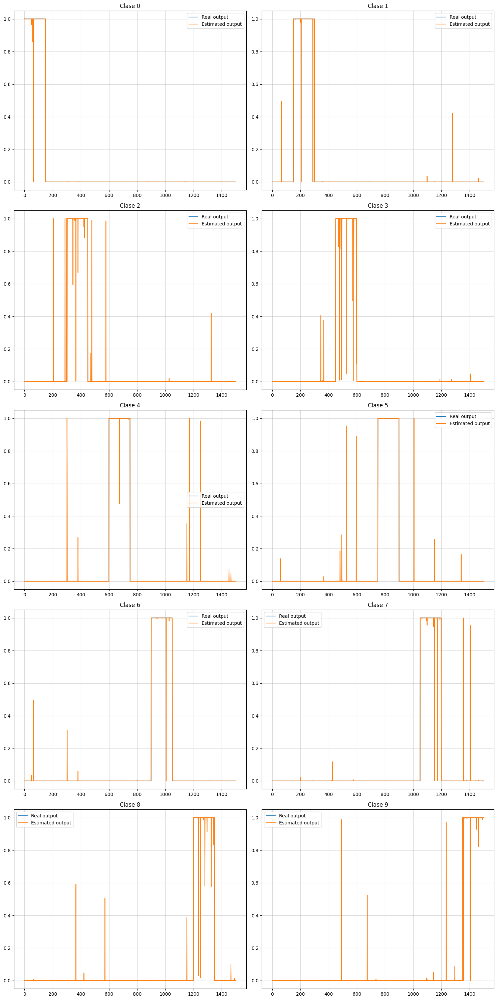

In [11]:
p = y.shape[1]
filas = p // 3 + (p % 3 > 0)  # Calcula el número de filas necesarias
fig, axs = plt.subplots(5, 2, figsize=(15, 30))  # Crea una gráfica con 'filas' filas y 3 columnas

axs = axs.ravel()  # Convierte el array de ejes en un array 1D para facilitar su manejo

for i in range(p):
    axs[i].plot(t, y[:, i], label="Real output")  # Estimated output vs real output
    axs[i].plot(t, y_prob_1[:, i], label="Estimated output")
    axs[i].legend()
    axs[i].grid(alpha=0.5)
    axs[i].set_title(f"Clase {labels[i]}")

plt.tight_layout()
plt.show()

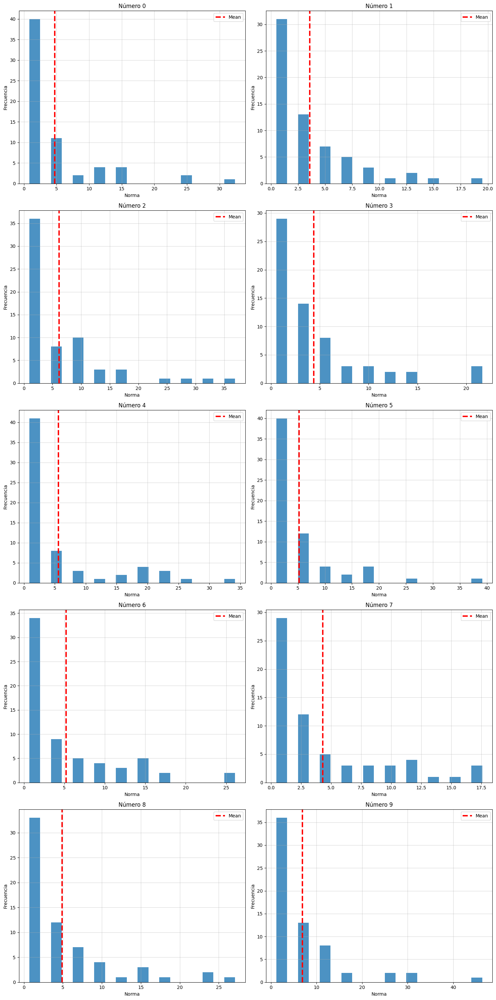

In [12]:
p = y.shape[1]
filas = p // 3 + (p % 3 > 0)  # Calcula el número de filas necesarias
fig, axs = plt.subplots(5, 2, figsize=(15, 30))  # Crea una gráfica con 'filas' filas y 3 columnas

axs = axs.ravel()  # Convierte el array de ejes en un array 1D para facilitar su manejo

for i in range(p):
    axs[i].hist(
        [torch.linalg.norm(y_e_1[:, j, i] - y_e_1[:, j, i].mean()) for j in range(64)],
        rwidth=0.5,
        alpha = 0.8
    )
    axs[i].axvline(
        np.mean([torch.linalg.norm(y_e_1[:, j, i] - y_e_1[:, j, i].mean()) for j in range(64)]),
        0,
        color="red",
        label="Mean",
        linestyle="--",
        linewidth=3
    )
    axs[i].grid(alpha=0.5)
    axs[i].set_title(f"Número {labels[i]}")
    axs[i].set_xlabel("Norma")
    axs[i].set_ylabel("Frecuencia")
    axs[i].legend()
    
plt.tight_layout()
plt.show()

In [13]:
X.shape

torch.Size([1500, 288])

In [14]:
# Supongamos que 'n' es el número de tensores en X
n = X.shape[1]

# Plotting the decomposition
i = 0
used = 0

fig, axs = plt.subplots(n // 3 + 1, 3, figsize=(20, 5 * (n // 3 + 1)))
for j in range(n):
    norm = torch.linalg.norm(y_e_1[:, j, i] - y_e_1[:, j, i].mean())
    tolerance = np.mean([torch.linalg.norm(y_e_1[:, k, i] - y_e_1[:, k, i].mean()) for k in range(64)])
    row = j // 3
    col = j % 3
    axs[row, col].axhline(0, color="red", linestyle="--", alpha=0.4)
    axs[row, col].axvline(0, color="red", linestyle="--", alpha=0.4)
    if norm > tolerance:
        axs[row, col].scatter(
            X[:, j], y_e_1[:, j, i] - y_e_1[:, j, i].mean(), s=10, alpha = 0.05
        )  # Estimated nonlinear contribution of xj on the output
        used +=1
    else:
       axs[row, col].scatter(
            X[:, j], y_e_1[:, j, i] - y_e_1[:, j, i].mean(), s=10, alpha = 0.05, color = 'red'
        )
    axs[row, col].set_title(f"Número {labels[i]}, entrada {j}")
    axs[row, col].grid(alpha=0.5)

axs[n // 3, n % 3].scatter(
    y[:, i].cpu(), y_prob_1[:, i].cpu(), marker="x"
)  # Calibration plot real output vs estimated output
axs[n // 3, n % 3].set_title(f"{labels[i+1]}, Calibración")
axs[n // 3, n % 3].set_xlabel("Salida real")
axs[n // 3, n % 3].set_ylabel("Salida estimada")
plt.show()
print()
print(f"Se usaron {used} entradas para la estimación del número {labels[i]}")


Se usaron 103 entradas para la estimación del número 0


In [15]:
used_all = {
    labels[i]: [] for i in range(p)
}

for i in range(p):
    for j in range(228):
        norm = torch.linalg.norm(y_e_1[:, j, i] - y_e_1[:, j, i].mean())
        tolerance = np.mean([torch.linalg.norm(y_e_1[:, k, i] - y_e_1[:, k, i].mean()) for k in range(64)])
        if norm > tolerance:
            used_all[labels[i]].append(j)

In [16]:
used_all

{'0': [1,
  2,
  4,
  5,
  15,
  16,
  20,
  22,
  23,
  26,
  31,
  34,
  37,
  40,
  41,
  48,
  49,
  50,
  52,
  58,
  59,
  61,
  73,
  76,
  85,
  86,
  88,
  89,
  92,
  94,
  95,
  98,
  101,
  103,
  104,
  107,
  109,
  111,
  112,
  113,
  114,
  115,
  121,
  124,
  128,
  131,
  133,
  134,
  137,
  140,
  142,
  145,
  147,
  148,
  151,
  157,
  158,
  160,
  161,
  167,
  176,
  178,
  180,
  186,
  187,
  190,
  193,
  194,
  197,
  199,
  202,
  203,
  205,
  206,
  208,
  211,
  214,
  215,
  221,
  222,
  223,
  227],
 '1': [1,
  2,
  4,
  5,
  7,
  13,
  15,
  16,
  25,
  26,
  31,
  37,
  40,
  44,
  46,
  49,
  50,
  52,
  53,
  58,
  59,
  85,
  86,
  88,
  91,
  94,
  95,
  97,
  98,
  100,
  101,
  103,
  106,
  107,
  112,
  113,
  115,
  121,
  124,
  125,
  128,
  130,
  133,
  134,
  136,
  137,
  142,
  145,
  147,
  151,
  157,
  159,
  160,
  161,
  166,
  167,
  168,
  178,
  182,
  184,
  185,
  187,
  188,
  190,
  193,
  194,
  195,
  196,
  199,
  

In [17]:
X.shape

torch.Size([1500, 288])

In [18]:
# Supongamos que 'n' es el número de tensores en X
n = X.shape[1] 

#  Solicitando las clases que se desean visualizar
i1 = 0
i2 = 4
i3 = 5

# Creando los subgráficos
fig, axs = plt.subplots(n // 3+1, 3, figsize=(20, 5 * (n // 3 + 1)))

# Plotting the decomposition for all three classes
for j in range(n):
    row = j // 3
    col = j % 3
    axs[row, col].axhline(0, color="red", linestyle="--", alpha=0.4)
    axs[row, col].axvline(0, color="red", linestyle="--", alpha=0.4)
    for i in [i1, i2, i3]:
        if j in used_all[labels[i]]:
            axs[row, col].scatter(
                X[:, j], y_e_1[:, j, i] - y_e_1[:, j, i].mean(), label=f"{labels[i]}", s=10, alpha = 0.1
            )
        else:
            axs[row, col].scatter(
                X[:, j], y_e_1[:, j, i] - y_e_1[:, j, i].mean(), label=f"Not used {labels[i]}", s=5, alpha = 0.1, color = 'gray'
            )
    axs[row, col].set_title(f"Entrada {j+1}")
    axs[row, col].legend()
    axs[row, col].grid(alpha=0.5)
plt.show() 